In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Dense
from tensorflow.keras import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from IPython.display import display
import gc
import random

In [2]:
# Hyperparameters
EPOCH = 5
BATCH_SIZE = 64
INPUT_HEIGHT = 500
INPUT_WIDTH = 500

In [3]:
def data_loader(folders):
    inputs = []
    outputs = []

    for label, folder in folders:
        for filename in os.listdir(folder):
            img = image.load_img(folder + filename, target_size = (INPUT_HEIGHT, INPUT_WIDTH))
            inputs.append(image.img_to_array(img))
            outputs.append([label == 'Araneae', label == 'Coleoptera'])

    inputs = preprocess_input(np.array(inputs))
    outputs = np.array(outputs).astype(np.float32)
    
    return inputs,outputs

In [4]:
train_folders = [('Araneae','ArTaxOr/Araneae/train/'),('Coleoptera', 'ArTaxOr/Coleoptera/train/')]
train_X, train_Y = data_loader(train_folders)

# Set up Neural Network

In [5]:
model = ResNet50(include_top = False, input_shape = (INPUT_HEIGHT, INPUT_WIDTH, 3), pooling = 'avg', classes = 2)
    
for layer in model.layers:
    layer.trainable = False
        
output = model.output
output = Dense(2, activation = 'tanh')(output)
model = Model(model.input, output)
model.compile(optimizer = 'adam', loss = "binary_crossentropy", metrics = ["accuracy"])
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 500, 500, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 506, 506, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 250, 250, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 250, 250, 64) 256         conv1_conv[0][0]                 
_______________________________________________________________________________________

In [6]:
history = model.fit(train_X, train_Y, batch_size = BATCH_SIZE, epochs = EPOCH, validation_split = 0.2)

Epoch 1/5
29/29 [==============================] - 655s 23s/step - loss: 1.3428 - accuracy: 0.6878 - val_loss: 2.1545 - val_accuracy: 0.3458
Epoch 2/5
29/29 [==============================] - 640s 22s/step - loss: 0.7538 - accuracy: 0.8078 - val_loss: 1.5887 - val_accuracy: 0.5396
Epoch 3/5
29/29 [==============================] - 639s 22s/step - loss: 0.6226 - accuracy: 0.8326 - val_loss: 2.8982 - val_accuracy: 0.3877
Epoch 4/5
29/29 [==============================] - 636s 22s/step - loss: 0.4831 - accuracy: 0.8778 - val_loss: 0.6427 - val_accuracy: 0.8414
Epoch 5/5
29/29 [==============================] - 868s 30s/step - loss: 0.3495 - accuracy: 0.9113 - val_loss: 0.3652 - val_accuracy: 0.9053


In [7]:
del train_X
del train_Y
gc.collect()

1554

# Evaluation

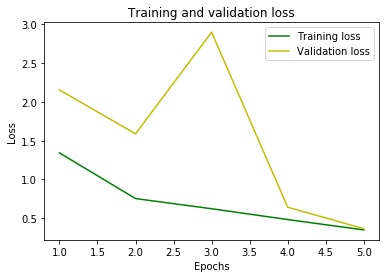

In [8]:
#Reference: https://towardsdatascience.com/machine-learning-recurrent-neural-networks-and-long-short-term-memory-lstm-python-keras-example-86001ceaaebc
plt.clf()
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'g', label = 'Training loss')
plt.plot(epochs, val_loss, 'y', label = 'Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

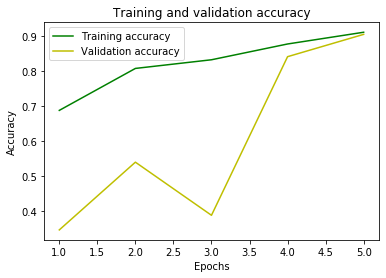

In [9]:
plt.clf()
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'g', label = 'Training accuracy')
plt.plot(epochs, val_acc, 'y', label = 'Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [10]:
test_folders = [('Araneae','ArTaxOr/Araneae/test/'),('Coleoptera', 'ArTaxOr/Coleoptera/test/')]
test_X,test_Y = data_loader(test_folders)
predict_y = model.predict(test_X)

In [11]:
loss, accuracy = model.evaluate(test_X, test_Y)
print('\n---------Test Data Evaluation---------')
print('loss: %f' % (loss))
print('accuracy: %f' %(accuracy))

71/71 [==============================] - 634s 9s/step - loss: 0.4030 - accuracy: 0.8977

---------Test Data Evaluation---------
loss: 0.403005
accuracy: 0.897697


In [12]:
del test_X
del test_Y
gc.collect()

7333

# Sample Tests

In [13]:
def sample_visualization(img_path):
    img = image.load_img(img_path)
    img_sm = image.load_img(img_path,target_size=(INPUT_HEIGHT, INPUT_WIDTH))
    img_arr = image.img_to_array(img_sm)
    img_arr = img_arr.reshape((1, INPUT_HEIGHT, INPUT_WIDTH, 3))
    display(img)
    Araneae_prob,Coleoptera_prob = model.predict(img_arr).reshape((2,))
    print('Image path: ' + img_path)
    print('Araneae Probability: %f' % (Araneae_prob))
    print('Coleoptera Probability: %f' % (Coleoptera_prob))
    if Araneae_prob > Coleoptera_prob:
        print('Predicted Class: Araneae')
    else:
        print('Predicted Class: Coleoptera')

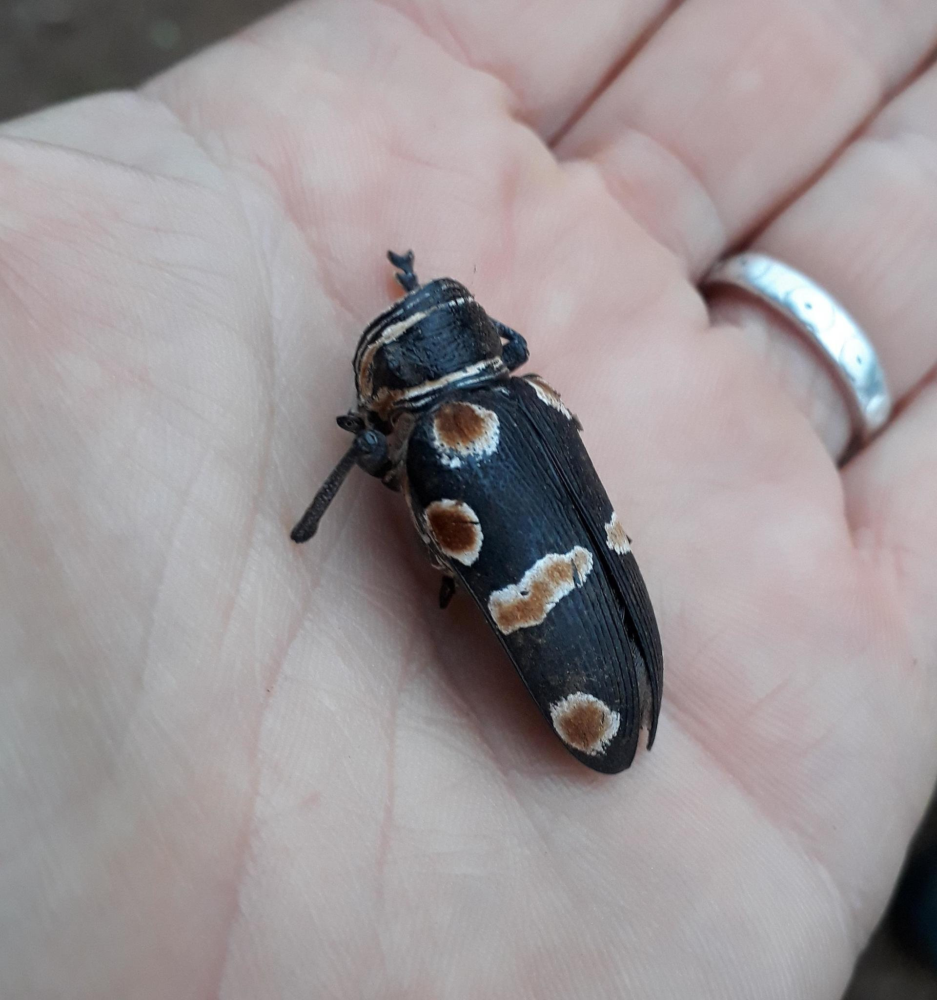

Image path: ArTaxOr/Coleoptera/test/0e77f221b216.jpg
Araneae Probability: -0.856334
Coleoptera Probability: 0.987900
Predicted Class: Coleoptera


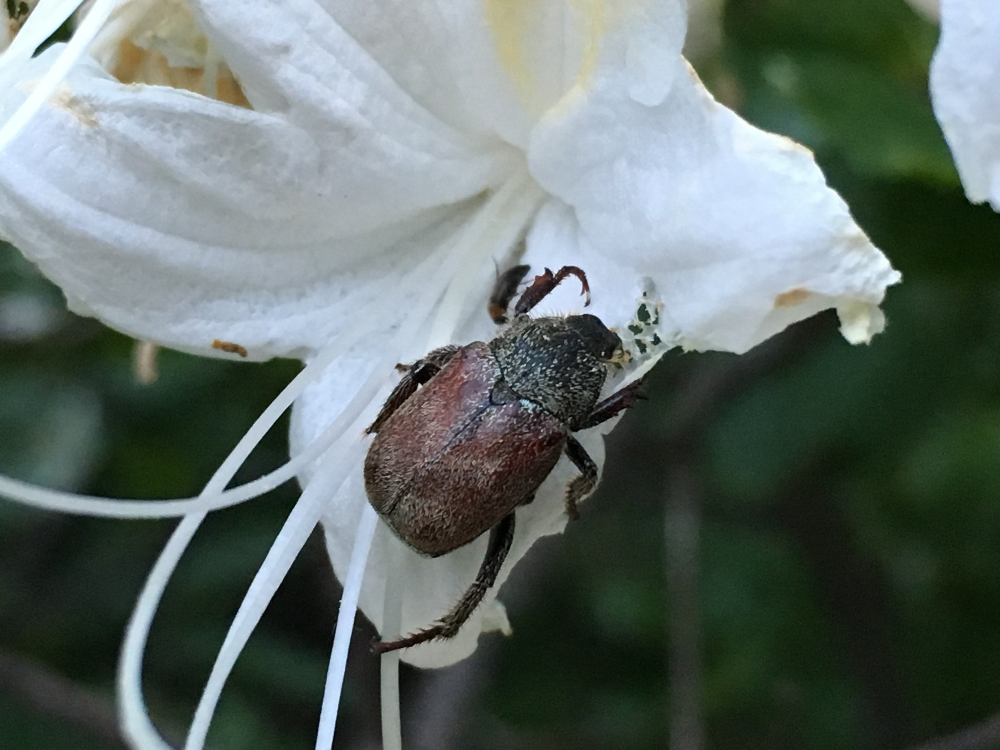

Image path: ArTaxOr/Coleoptera/test/80aef02ad3af.jpg
Araneae Probability: -0.332911
Coleoptera Probability: 0.975294
Predicted Class: Coleoptera


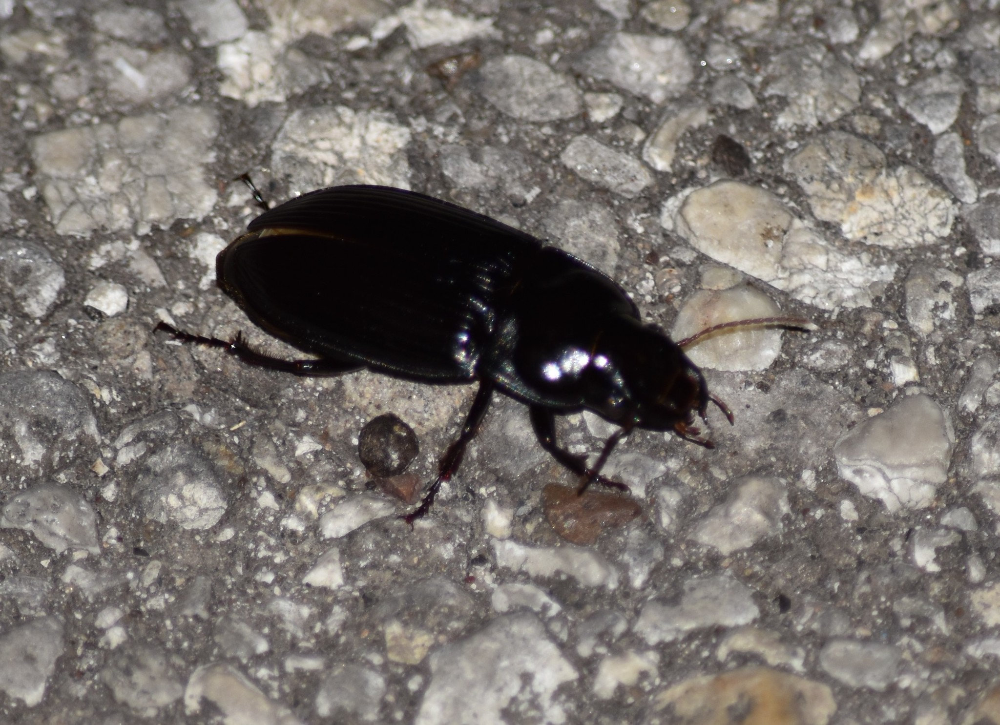

Image path: ArTaxOr/Coleoptera/test/7dccf5757d88.jpg
Araneae Probability: -0.611481
Coleoptera Probability: 0.993437
Predicted Class: Coleoptera


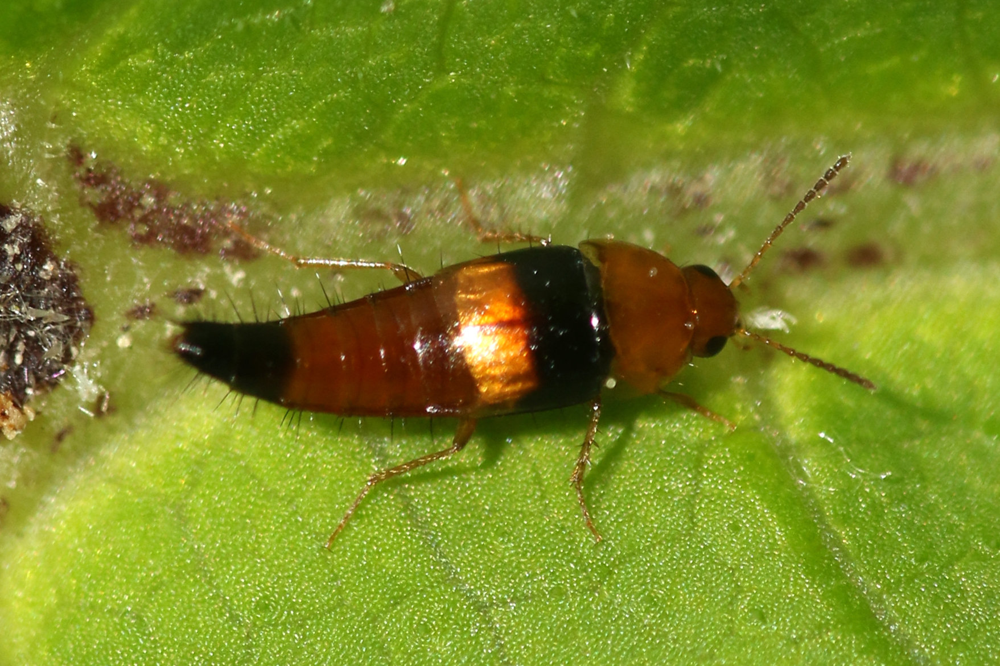

Image path: ArTaxOr/Coleoptera/test/01a8549b844b.jpg
Araneae Probability: -0.705095
Coleoptera Probability: 0.993527
Predicted Class: Coleoptera


In [15]:
files_list = []
for folder, folders, files in os.walk('ArTaxOr/Araneae/test/'):
    for filename in files:
        files_list.append(folder + filename)
for folder, folders, files in os.walk('ArTaxOr/Coleoptera/test/'):
    for filename in files:
        files_list.append(folder + filename)
for i in range(4):
    img_path = random.choice(files_list)
    sample_visualization(img_path)